In [1]:
# Montar Google Drive
from google.colab import drive
drive.mount('/content/drive')

print("montado correctamente")

Mounted at /content/drive
montado correctamente


In [2]:
# Crear estructura de carpetas
import os
import shutil

# Crear estructura local en Colab
base_path = "/content/Tarea5_IA"
os.makedirs(f"{base_path}/configs/model", exist_ok=True)
os.makedirs(f"{base_path}/configs/trainer", exist_ok=True)
os.makedirs(f"{base_path}/configs/logger", exist_ok=True)

# Copiar datos desde Drive a local
drive_data_path = "/content/drive/MyDrive/Tarea5_IA/mvtec_data"
local_data_path = f"{base_path}/data"

if os.path.exists(drive_data_path):
    shutil.copytree(drive_data_path, local_data_path)
    print("Datos copiados de Drive a local")
else:
    print("No se encontraron datos en Drive. Verifica la ruta.")

print("Estructura creada:")
!find /content/Tarea5_IA -type d

Datos copiados de Drive a local
Estructura creada:
/content/Tarea5_IA
/content/Tarea5_IA/data
/content/Tarea5_IA/data/capsule
/content/Tarea5_IA/data/capsule/train
/content/Tarea5_IA/data/capsule/train/good
/content/Tarea5_IA/data/capsule/test
/content/Tarea5_IA/data/capsule/test/squeeze
/content/Tarea5_IA/data/capsule/test/poke
/content/Tarea5_IA/data/capsule/test/good
/content/Tarea5_IA/data/capsule/test/scratch
/content/Tarea5_IA/data/capsule/test/crack
/content/Tarea5_IA/data/capsule/test/faulty_imprint
/content/Tarea5_IA/data/transistor
/content/Tarea5_IA/data/transistor/train
/content/Tarea5_IA/data/transistor/train/good
/content/Tarea5_IA/data/transistor/test
/content/Tarea5_IA/data/transistor/test/bent_lead
/content/Tarea5_IA/data/transistor/test/good
/content/Tarea5_IA/data/transistor/test/misplaced
/content/Tarea5_IA/data/transistor/test/cut_lead
/content/Tarea5_IA/data/transistor/test/damaged_case
/content/Tarea5_IA/data/cable
/content/Tarea5_IA/data/cable/train
/content/Tar

In [3]:
# Crear validation set (20% de train/good)
import os
import random
import shutil

def create_validation_set():
    classes = ['cable', 'capsule', 'screw', 'transistor']

    for class_name in classes:
        train_good_dir = os.path.join(local_data_path, class_name, 'train', 'good')
        val_dir = os.path.join(local_data_path, class_name, 'val', 'good')

        # Crear directorio val/good
        os.makedirs(val_dir, exist_ok=True)

        # Obtener imágenes de train/good
        if os.path.exists(train_good_dir):
            images = [f for f in os.listdir(train_good_dir)
                     if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            # Calcular 20% para validation
            num_val = int(0.2 * len(images))
            val_images = random.sample(images, num_val)

            # Mover imágenes a validation
            for img in val_images:
                src = os.path.join(train_good_dir, img)
                dst = os.path.join(val_dir, img)
                shutil.move(src, dst)

            print(f"{class_name}: {len(images)-num_val} train, {num_val} val")
        else:
            print(f"No existe: {train_good_dir}")

create_validation_set()

cable: 180 train, 44 val
capsule: 28 train, 6 val
screw: 256 train, 64 val
transistor: 171 train, 42 val


In [4]:
# Instalar paquetes necesarios
!pip install lightning pytorch-lightning hydra-core wandb torchvision pytorch-msssim opencv-python scikit-learn

print("Todas las dependencias instaladas")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 827.9/827.9 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.6/831.6 kB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 65.0 MB/s eta 0:00:00
Todas las dependencias instaladas


In [41]:
def create_hydra_configs():
    # config.yaml
    config_content = """
defaults:
  - model: classic
  - trainer: default
  - logger: wandb
  - _self_
experiment_name: "classic_ae_l1"
accelerator: "auto"
dataset:
  _target_: __main__.MVTecMultiClassDataModule  # CORREGIDO: agregado __main__.
  root: "/content/Tarea5_IA/data"
  batch_size: 32
  img_size: 128
  num_workers: 2
loss:
  _target_: torch.nn.L1Loss
seed: 42
"""
    with open(f"{base_path}/configs/config.yaml", "w") as f:
        f.write(config_content)

    # model/classic.yaml (CORREGIDO: __main__ en _target_)
    classic_content = """
name: "classic_autoencoder"
architecture: "classic"
model:
  _target_: __main__.ClassicAE
  latent_dim: 128
"""
    with open(f"{base_path}/configs/model/classic.yaml", "w") as f:
        f.write(classic_content)

    # model/unet.yaml (CORREGIDO: __main__ en _target_)
    unet_content = """
name: "unet_autoencoder"
architecture: "unet"
model:
  _target_: __main__.UNetAE
  latent_dim: 128
"""
    with open(f"{base_path}/configs/model/unet.yaml", "w") as f:
        f.write(unet_content)

    # trainer/default.yaml
    trainer_content = """
max_epochs: 50
learning_rate: 0.001
"""
    with open(f"{base_path}/configs/trainer/default.yaml", "w") as f:
        f.write(trainer_content)

    # logger/wandb.yaml
    logger_content = """
_target_: pytorch_lightning.loggers.WandbLogger
project: "tarea5_autoencoders"
name: ${experiment_name}
"""
    with open(f"{base_path}/configs/logger/wandb.yaml", "w") as f:
        f.write(logger_content)

    print("Archivos de configuración Hydra creados")
create_hydra_configs()

Archivos de configuración Hydra creados


In [42]:
#Imports necesarios
import torch
from torch import nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import lightning as L
import hydra
from hydra.core.global_hydra import GlobalHydra
from omegaconf import DictConfig, OmegaConf
import wandb
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from sklearn.manifold import TSNE
import pytorch_msssim


In [43]:
# Configuración
torch.set_float32_matmul_precision("medium")


In [44]:
class ClassicAE(nn.Module):
    def __init__(self, latent_dim=128, **kwargs):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),   # (B, 32, 64, 64)
            nn.ReLU(),

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # (B, 64, 32, 32)
            nn.ReLU(),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), # (B, 128, 16, 16)
            nn.ReLU(),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),# (B, 256, 8, 8)
            nn.ReLU(),
        )
        self.flatten = nn.Flatten()  # output = 256*8*8 = 16384
        self.fc_mu = nn.Linear(256 * 8 * 8, latent_dim)


        self.fc_decode = nn.Linear(latent_dim, 256 * 8 * 8)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1), # 16x16
            nn.ReLU(),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 32x32
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),   # 64x64
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),    # 128x128
            nn.Sigmoid()  # imágen RGB normalizada 0–1
        )

    def forward(self, x):
        # Encode
        z = self.encoder(x)
        z = self.flatten(z)
        z = self.fc_mu(z)

        # Decode
        out = self.fc_decode(z)
        out = out.view(-1, 256, 8, 8)
        out = self.decoder(out)

        return out, z

In [45]:
class UNetAE(nn.Module):
    def __init__(self, latent_dim=128, **kwargs):
        super().__init__()

        # ============================================
        # ENCODER con capas individuales para skip connections
        # ============================================
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),   # (B, 32, 64, 64)
            nn.ReLU()
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # (B, 64, 32, 32)
            nn.ReLU()
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), # (B, 128, 16, 16)
            nn.ReLU()
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),# (B, 256, 8, 8)
            nn.ReLU()
        )

        # ============================================
        # BOTTLENECK (Latent Space)
        # ============================================
        self.flatten = nn.Flatten()  # 256*8*8 = 16384
        self.fc_mu = nn.Linear(256 * 8 * 8, latent_dim)
        self.fc_decode = nn.Linear(latent_dim, 256 * 8 * 8)

        # ============================================
        # DECODER con skip connections
        # ============================================
        # Nota: Los canales de entrada se duplican por las skip connections

        self.dec1 = nn.Sequential(
            # 256 (from bottleneck) + 256 (skip from enc4) = 512 input channels
            nn.ConvTranspose2d(256 + 256, 128, kernel_size=4, stride=2, padding=1), # 16x16
            nn.ReLU()
        )
        self.dec2 = nn.Sequential(
            # 128 (from dec1) + 128 (skip from enc3) = 256 input channels
            nn.ConvTranspose2d(128 + 128, 64, kernel_size=4, stride=2, padding=1),  # 32x32
            nn.ReLU()
        )
        self.dec3 = nn.Sequential(
            # 64 (from dec2) + 64 (skip from enc2) = 128 input channels
            nn.ConvTranspose2d(64 + 64, 32, kernel_size=4, stride=2, padding=1),   # 64x64
            nn.ReLU()
        )
        self.dec4 = nn.Sequential(
            # 32 (from dec3) + 32 (skip from enc1) = 64 input channels
            nn.ConvTranspose2d(32 + 32, 3, kernel_size=4, stride=2, padding=1),    # 128x128
            nn.Sigmoid()  # imagen RGB normalizada 0-1
        )

    def forward(self, x):
        # ============================================
        # ENCODER - Guardar skip connections
        # ============================================
        skip1 = self.enc1(x)       # (B, 32, 64, 64)
        skip2 = self.enc2(skip1)   # (B, 64, 32, 32)
        skip3 = self.enc3(skip2)   # (B, 128, 16, 16)
        skip4 = self.enc4(skip3)   # (B, 256, 8, 8)

        # ============================================
        # BOTTLENECK
        # ============================================
        z = self.flatten(skip4)
        z = self.fc_mu(z)

        # ============================================
        # DECODER - Usar skip connections
        # ============================================
        out = self.fc_decode(z)
        out = out.view(-1, 256, 8, 8)

        # Concatenar skip connection 4
        out = torch.cat([out, skip4], dim=1)  # (B, 512, 8, 8)
        out = self.dec1(out)                   # (B, 128, 16, 16)

        # Concatenar skip connection 3
        out = torch.cat([out, skip3], dim=1)  # (B, 256, 16, 16)
        out = self.dec2(out)                   # (B, 64, 32, 32)

        # Concatenar skip connection 2
        out = torch.cat([out, skip2], dim=1)  # (B, 128, 32, 32)
        out = self.dec3(out)                   # (B, 32, 64, 64)

        # Concatenar skip connection 1
        out = torch.cat([out, skip1], dim=1)  # (B, 64, 64, 64)
        out = self.dec4(out)                   # (B, 3, 128, 128)

        return out, z

In [46]:
class SSIMLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x, y):
        return 1 - pytorch_msssim.ssim(x, y, data_range=1.0, size_average=True)

class SSIML1Loss(nn.Module):
    def __init__(self, alpha=0.84):
        super().__init__()
        self.alpha = alpha
        self.ssim = SSIMLoss()
        self.l1 = nn.L1Loss()

    def forward(self, x, y):
        return self.alpha * self.ssim(x, y) + (1 - self.alpha) * self.l1(x, y)

print("Funciones de pérdida definidas")

Funciones de pérdida definidas


In [47]:
#Lightning Module
class LitAutoencoder(L.LightningModule):
    def __init__(self, cfg):
        super().__init__()
        self.save_hyperparameters()
        self.model = hydra.utils.instantiate(cfg.model.model)
        self.loss_fn = hydra.utils.instantiate(cfg.loss)
        self.lr = cfg.trainer.learning_rate

        # Para visualizaciones
        self.class_samples = {}
        self.classes = ["cable", "capsule", "screw", "transistor"]
        self.train_loss_history = []
        self.val_loss_history = []
        self.current_train_losses = []

        # Para análisis
        self.latent_vectors = []
        self.latent_labels = []

    def training_step(self, batch, batch_idx):
        x, _ = batch
        x_rec, _ = self.model(x)
        loss = self.loss_fn(x_rec, x)
        self.current_train_losses.append(loss.detach().cpu().item())
        self.log("train_loss", loss, prog_bar=True)
        return loss

    def on_train_epoch_end(self):
        if self.current_train_losses:
            avg_loss = sum(self.current_train_losses) / len(self.current_train_losses)
            self.train_loss_history.append(avg_loss)
            self.current_train_losses = []

    def validation_step(self, batch, batch_idx):
        x, paths = batch
        x_rec, z = self.model(x)
        loss = self.loss_fn(x_rec, x)

        # Guardar para t-SNE
        for i, path in enumerate(paths):
            class_name = path.split("/")[-4]  # cable, capsule, etc.
            self.latent_vectors.append(z[i].detach().cpu())
            self.latent_labels.append(class_name)

        # Guardar muestras por clase
        for i, p in enumerate(paths):
            clase = p.split("/")[-4]
            if clase in self.classes:
                if clase not in self.class_samples:
                    self.class_samples[clase] = []
                if len(self.class_samples[clase]) < 2:
                    self.class_samples[clase].append((
                        x[i].detach().cpu(),
                        x_rec[i].detach().cpu()
                    ))

        self.log("val_loss", loss, prog_bar=True)
        return loss

    def on_validation_epoch_end(self):
        # Reconstrucciones por clase cada 10 épocas
        if self.current_epoch % 10 == 0:
            self._log_reconstructions()

        # t-SNE cada 20 épocas
        if self.current_epoch % 20 == 0 and len(self.latent_vectors) > 0:
            self._log_tsne_analysis()

        # Reset
        self.class_samples = {}
        self.latent_vectors = []
        self.latent_labels = []

    def test_step(self, batch, batch_idx):
        x, paths = batch
        x_rec, _ = self.model(x)
        loss = self.loss_fn(x_rec, x)

        # Guardar para análisis de test
        if not hasattr(self, 'test_samples'):
            self.test_samples = []

        for i in range(min(4, len(x))):
            is_anomaly = "good" not in paths[i]
            self.test_samples.append({
                'original': x[i].cpu(),
                'reconstructed': x_rec[i].cpu(),
                'is_anomaly': is_anomaly,
                'path': paths[i]
            })

        self.log("test_loss", loss)
        return loss

    def on_test_epoch_end(self):
        if hasattr(self, 'test_samples'):
            self._log_test_reconstructions()
            self._log_error_histograms()

    def _log_reconstructions(self):
        """Log reconstrucciones de validación a WandB"""
        imgs = []
        for clase in self.classes:
            if clase in self.class_samples and len(self.class_samples[clase]) >= 2:
                for orig, rec in self.class_samples[clase]:
                    imgs.append(wandb.Image(orig.permute(1,2,0).numpy(),
                                          caption=f"{clase}_orig"))
                    imgs.append(wandb.Image(rec.permute(1,2,0).numpy(),
                                          caption=f"{clase}_recon"))

        if imgs:
            self.logger.experiment.log({
                "val_reconstructions": imgs,
                "epoch": self.current_epoch
            })

    def _log_tsne_analysis(self):
        """Análisis t-SNE del espacio latente"""
        if len(self.latent_vectors) < 10:
            return

        vectors = torch.stack(self.latent_vectors)
        tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(vectors)-1))
        vectors_2d = tsne.fit_transform(vectors.numpy())

        plt.figure(figsize=(10, 8))
        for class_name in set(self.latent_labels):
            indices = [i for i, label in enumerate(self.latent_labels) if label == class_name]
            plt.scatter(vectors_2d[indices, 0], vectors_2d[indices, 1],
                       label=class_name, alpha=0.7)
        plt.legend()
        plt.title(f"t-SNE Latent Space - Epoch {self.current_epoch}")

        self.logger.experiment.log({
            "latent_space_tsne": wandb.Image(plt),
            "epoch": self.current_epoch
        })
        plt.close()

    def _log_test_reconstructions(self):
        """Reconstrucciones de test con anomalías"""
        fig, axes = plt.subplots(4, 4, figsize=(16, 16))
        for idx in range(min(16, len(self.test_samples))):
            sample = self.test_samples[idx]
            row = idx // 4
            col = idx % 4

            # Original
            axes[row, col*2].imshow(sample['original'].permute(1,2,0).numpy())
            status = "ANOMALY" if sample['is_anomaly'] else "GOOD"
            axes[row, col*2].set_title(f"Original: {status}")
            axes[row, col*2].axis('off')

            # Reconstruida
            axes[row, col*2+1].imshow(sample['reconstructed'].permute(1,2,0).numpy())
            axes[row, col*2+1].set_title("Reconstructed")
            axes[row, col*2+1].axis('off')

        plt.tight_layout()
        self.logger.experiment.log({"test_reconstructions": wandb.Image(plt)})
        plt.close()

    def _log_error_histograms(self):
        """Histogramas de error para normales vs anomalías"""
        normal_errors = []
        anomaly_errors = []

        for sample in self.test_samples:
            error = torch.mean(torch.abs(sample['reconstructed'] - sample['original'])).item()
            if sample['is_anomaly']:
                anomaly_errors.append(error)
            else:
                normal_errors.append(error)

        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.hist(normal_errors, bins=30, alpha=0.7, label="Normales", color='green')
        plt.hist(anomaly_errors, bins=30, alpha=0.7, label="Anomalías", color='red')
        plt.xlabel("Error de Reconstrucción")
        plt.ylabel("Frecuencia")
        plt.legend()
        plt.title("Distribución de Errores")

        plt.subplot(1, 2, 2)
        plt.boxplot([normal_errors, anomaly_errors], labels=["Normales", "Anomalías"])
        plt.title("Comparación de Errores")

        plt.tight_layout()
        self.logger.experiment.log({"error_analysis": wandb.Image(plt)})
        plt.close()

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

print("Lightning Module definido")

Lightning Module definido


In [48]:
class ImageFolderCustom(Dataset):
    def __init__(self, file_paths, transform=None):
        self.files = file_paths
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        path = self.files[idx]
        img = Image.open(path).convert("RGB")

        if self.transform:
            img = self.transform(img)

        return img, path

class MVTecMultiClassDataModule(L.LightningDataModule):
    def __init__(self, root, batch_size, num_workers, img_size):
        super().__init__()
        self.root = root
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.img_size = img_size

        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor()
        ])

        self.classes = ["cable", "capsule", "screw", "transistor"]

    def setup(self, stage=None):
        train_files = []
        val_files = []
        test_files = []

        for clase in self.classes:
            base = f"{self.root}/{clase}"

            # Train: solo imágenes buenas
            train_dir = f"{base}/train/good"
            if os.path.exists(train_dir):
                train_files.extend([
                    os.path.join(train_dir, f)
                    for f in os.listdir(train_dir)
                    if f.lower().endswith((".png",".jpg",".jpeg",".bmp"))
                ])

            # Validation: solo imágenes buenas
            val_dir = f"{base}/val/good"
            if os.path.exists(val_dir):
                val_files.extend([
                    os.path.join(val_dir, f)
                    for f in os.listdir(val_dir)
                    if f.lower().endswith((".png",".jpg",".jpeg",".bmp"))
                ])

            # Test: todas las imágenes (good + defectos)
            test_root = f"{base}/test"
            if os.path.exists(test_root):
                for subfolder in os.listdir(test_root):
                    subpath = os.path.join(test_root, subfolder)
                    if not os.path.isdir(subpath):
                        continue
                    test_files.extend([
                        os.path.join(subpath, f)
                        for f in os.listdir(subpath)
                        if f.lower().endswith((".png",".jpg",".jpeg",".bmp"))
                    ])

        self.train_ds = ImageFolderCustom(train_files, transform=self.transform)
        self.val_ds   = ImageFolderCustom(val_files, transform=self.transform)
        self.test_ds  = ImageFolderCustom(test_files, transform=self.transform)

        print(f"[INFO] Train: {len(self.train_ds)} imgs, Val: {len(self.val_ds)} imgs, Test: {len(self.test_ds)} imgs")

    def train_dataloader(self):
        return DataLoader(
            self.train_ds,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_ds,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_ds,
            batch_size=self.batch_size,
            shuffle=False,
            num_workers=self.num_workers
        )

print("DataModule definido")

DataModule definido


In [49]:
!wandb login

wandb: Currently logged in as: juliojvv20lol (juliojvv20lol-tec) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [50]:
from pathlib import Path

In [51]:
#Función para ejecutar experimentos individuales
import os
from pathlib import Path
# Cambiar al directorio del proyecto
os.chdir(base_path)
def run_single_experiment(model_name="classic", loss_name="l1"):
    """Ejecuta un solo experimento"""
    # Mapeo de funciones de pérdida
    loss_mapping = {
        "l1": "torch.nn.L1Loss",
        "l2": "torch.nn.MSELoss",
        "ssim": "__main__.SSIMLoss",
        "ssim_l1": "__main__.SSIML1Loss"
    }
    # Configurar Hydra con ruta ABSOLUTA
    GlobalHydra.instance().clear()
    from hydra import initialize_config_dir, compose
    # Obtener ruta absoluta de configs
    config_dir_abs = Path(base_path) / "configs"
    print(f"Buscando configs en: {config_dir_abs}")
    # Verificar que existe la carpeta de configs
    if not config_dir_abs.exists():
        print(f" No se encuentra la carpeta de configs en {config_dir_abs}")
        return
    initialize_config_dir(config_dir=str(config_dir_abs), version_base=None)
    # Overrides:
    overrides = [
        f"model={model_name}",
        f"loss._target_={loss_mapping[loss_name]}",
        f"experiment_name={model_name}_{loss_name}"
    ]
    print(f"Overrides: {overrides}")
    cfg = compose(config_name="config", overrides=overrides)
    print(f" Iniciando experimento: {cfg.experiment_name}")
    print(f" Modelo: {model_name}, Loss: {loss_name}")
    print(f" Latent dim: {cfg.model.model.latent_dim}")
    print(f" Epochs: {cfg.trainer.max_epochs}")
    try:
        # Entrenar
        dm = hydra.utils.instantiate(cfg.dataset)
        model = LitAutoencoder(cfg)
        logger = hydra.utils.instantiate(cfg.logger)
        trainer = L.Trainer(
            max_epochs=cfg.trainer.max_epochs,
            logger=logger,
            accelerator=cfg.accelerator,
            log_every_n_steps=10,
        )
        print("Iniciando entrenamiento...")
        trainer.fit(model, dm)
        print("Iniciando testing...")
        trainer.test(model, dm)
        # Cerrar WandB
        logger.experiment.finish()
        print(f"Experimento {cfg.experiment_name} completado\n")
    except Exception as e:
        print(f"Error en experimento {model_name}_{loss_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        # Cerrar WandB si hubo error
        if 'logger' in locals():
            logger.experiment.finish()
print("Función de experimentos definida")

Función de experimentos definida


Iniciando las 8 configuraciones
EXPERIMENTO 1/8: classic + l1
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=classic', 'loss._target_=torch.nn.L1Loss', 'experiment_name=classic_l1']
 Iniciando experimento: classic_l1
 Modelo: classic, Loss: l1
 Latent dim: 128
 Epochs: 50


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Iniciando entrenamiento...


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: Currently logged in as: juliojvv20lol (juliojvv20lol-tec) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | ClassicAE | 5.6 M  | train
1 | loss_fn | L1Loss    | 0      | train
----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | ClassicAE | 5.6 M  | train
1 | loss_fn | L1Loss    | 0      | train
----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 32. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 28. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento classic_l1: index 4 is out of bounds for axis 1 with size 4


/usr/local/lib/python3.12/dist-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 26. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  F

epoch,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇██
train_loss,█▅▇▃▂▃▃▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▁▂▁▂▁▁▁▁▂▁▁▁▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇██
val_loss,█▆▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.02899
trainer/global_step,999
val_loss,0.03462


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


EXPERIMENTO 2/8: classic + l2
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=classic', 'loss._target_=torch.nn.MSELoss', 'experiment_name=classic_l2']
 Iniciando experimento: classic_l2
 Modelo: classic, Loss: l2
 Latent dim: 128
 Epochs: 50
Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | ClassicAE | 5.6 M  | train
1 | loss_fn | MSELoss   | 0      | train
----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | ClassicAE | 5.6 M  | train
1 | loss_fn | MSELoss   | 0      | train
----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval

[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento classic_l2: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇████
train_loss,█▄▃▂▂▂▂▂▁▂▂▁▂▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
val_loss,█▃▃▃▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.00207
trainer/global_step,999
val_loss,0.0033


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


EXPERIMENTO 3/8: classic + ssim
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=classic', 'loss._target_=__main__.SSIMLoss', 'experiment_name=classic_ssim']
 Iniciando experimento: classic_ssim
 Modelo: classic, Loss: ssim
 Latent dim: 128
 Epochs: 50


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | ClassicAE | 5.6 M  | train
1 | loss_fn | SSIMLoss  | 0      | train
----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type      | Params | Mode 
----------------------------------------------
0 | model   | ClassicAE | 5.6 M  | train
1 | loss_fn | SSIMLoss  | 0      | train
----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
23        Modules in train mode
0         Modules in eval

[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento classic_ssim: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇██
train_loss,██▅▅▆▄▅▄▄▄▄▃▄▃▄▃▃▃▄▃▃▂▃▃▃▂▃▂▂▃▂▂▁▂▁▂▁▁▁▂
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇█████
val_loss,██▆▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.11583
trainer/global_step,999
val_loss,0.18203


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


EXPERIMENTO 4/8: classic + ssim_l1
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=classic', 'loss._target_=__main__.SSIML1Loss', 'experiment_name=classic_ssim_l1']
 Iniciando experimento: classic_ssim_l1
 Modelo: classic, Loss: ssim_l1
 Latent dim: 128
 Epochs: 50
Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | model   | ClassicAE  | 5.6 M  | train
1 | loss_fn | SSIML1Loss | 0      | train
-----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
25        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | model   | ClassicAE  | 5.6 M  | train
1 | loss_fn | SSIML1Loss | 0      | train
-----------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.363    Total estimated model params size (MB)
25        Modules in train mode
0         Modul

[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento classic_ssim_l1: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇██
train_loss,█▄▅▅▄▃▄▃▄▃▂▃▂▃▂▂▂▂▂▂▂▂▂▁▂▂▁▂▂▁▂▁▁▁▁▁▂▁▁▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇█
val_loss,█▇▅▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.11262
trainer/global_step,999
val_loss,0.14519


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


EXPERIMENTO 5/8: unet + l1
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=unet', 'loss._target_=torch.nn.L1Loss', 'experiment_name=unet_l1']
 Iniciando experimento: unet_l1
 Modelo: unet, Loss: l1
 Latent dim: 128
 Epochs: 50
Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type   | Params | Mode 
-------------------------------------------
0 | model   | UNetAE | 6.3 M  | train
1 | loss_fn | L1Loss | 0      | train
-------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
29        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type   | Params | Mode 
-------------------------------------------
0 | model   | UNetAE | 6.3 M  | train
1 | loss_fn | L1Loss | 0      | train
-------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
29        Modules in train mode
0         Modules in eval mode


[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento unet_l1: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇█████
train_loss,█▃▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇██
val_loss,█▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▁▂▂▁▁▁▁▁▂▁▁▁▁▁▁▁
epoch,49
train_loss,0.01531
trainer/global_step,999
val_loss,0.01409


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


EXPERIMENTO 6/8: unet + l2
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=unet', 'loss._target_=torch.nn.MSELoss', 'experiment_name=unet_l2']
 Iniciando experimento: unet_l2
 Modelo: unet, Loss: l2
 Latent dim: 128
 Epochs: 50
Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type    | Params | Mode 
--------------------------------------------
0 | model   | UNetAE  | 6.3 M  | train
1 | loss_fn | MSELoss | 0      | train
--------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
29        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type    | Params | Mode 
--------------------------------------------
0 | model   | UNetAE  | 6.3 M  | train
1 | loss_fn | MSELoss | 0      | train
--------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
29        Modules in train mode
0         Modules in eval mode


[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento unet_l2: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇███
train_loss,█▇▄▄▃▃▃▃▂▂▁▂▂▂▁▁▂▁▂▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▂▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▆▇▇▇▇▇▇▇██
val_loss,█▄▃▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.00045
trainer/global_step,999
val_loss,0.00042


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


EXPERIMENTO 7/8: unet + ssim
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=unet', 'loss._target_=__main__.SSIMLoss', 'experiment_name=unet_ssim']
 Iniciando experimento: unet_ssim
 Modelo: unet, Loss: ssim
 Latent dim: 128
 Epochs: 50
Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | UNetAE   | 6.3 M  | train
1 | loss_fn | SSIMLoss | 0      | train
---------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
29        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | UNetAE   | 6.3 M  | train
1 | loss_fn | SSIMLoss | 0      | train
---------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
29        Modules in train mode
0         Modules in eval mode


[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento unet_ssim: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▆▆▆▆▆▆▆▆▇▇▇▇██
train_loss,██▇▅▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇███
val_loss,█▅▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.01714
trainer/global_step,999
val_loss,0.0161


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


EXPERIMENTO 8/8: unet + ssim_l1
Buscando configs en: /content/Tarea5_IA/configs
Overrides: ['model=unet', 'loss._target_=__main__.SSIML1Loss', 'experiment_name=unet_ssim_l1']
 Iniciando experimento: unet_ssim_l1
 Modelo: unet, Loss: ssim_l1
 Latent dim: 128
 Epochs: 50
Iniciando entrenamiento...


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | model   | UNetAE     | 6.3 M  | train
1 | loss_fn | SSIML1Loss | 0      | train
-----------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
31        Modules in train mode
0         Modules in eval mode
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type       | Params | Mode 
-----------------------------------------------
0 | model   | UNetAE     | 6.3 M  | train
1 | loss_fn | SSIML1Loss | 0      | train
-----------------------------------------------
6.3 M     Trainable params
0         Non-trainable params
6.3 M     Total params
25.122    Total estimated model params size (MB)
31        Modules in train mode
0         Modul

[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Iniciando testing...
[INFO] Train: 635 imgs, Val: 156 imgs, Test: 410 imgs


Testing: |          | 0/? [00:00<?, ?it/s]

Error en experimento unet_ssim_l1: index 4 is out of bounds for axis 1 with size 4


Traceback (most recent call last):
  File "/tmp/ipython-input-3164370473.py", line 53, in run_single_experiment
    trainer.test(model, dm)
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 774, in test
    return call._call_and_handle_interrupt(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/call.py", line 49, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 816, in _test_impl
    results = self._run(model, ckpt_path=ckpt_path)
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer.py", line 1011, in _run
    results = self._run_stage()
              ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/lightning/pytorch/trainer/trainer

epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▇▇▇▇█
train_loss,█▇▆▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
trainer/global_step,▁▁▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
val_loss,█▅▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,49
train_loss,0.01402
trainer/global_step,999
val_loss,0.0169


Todos los experimentos se completaron


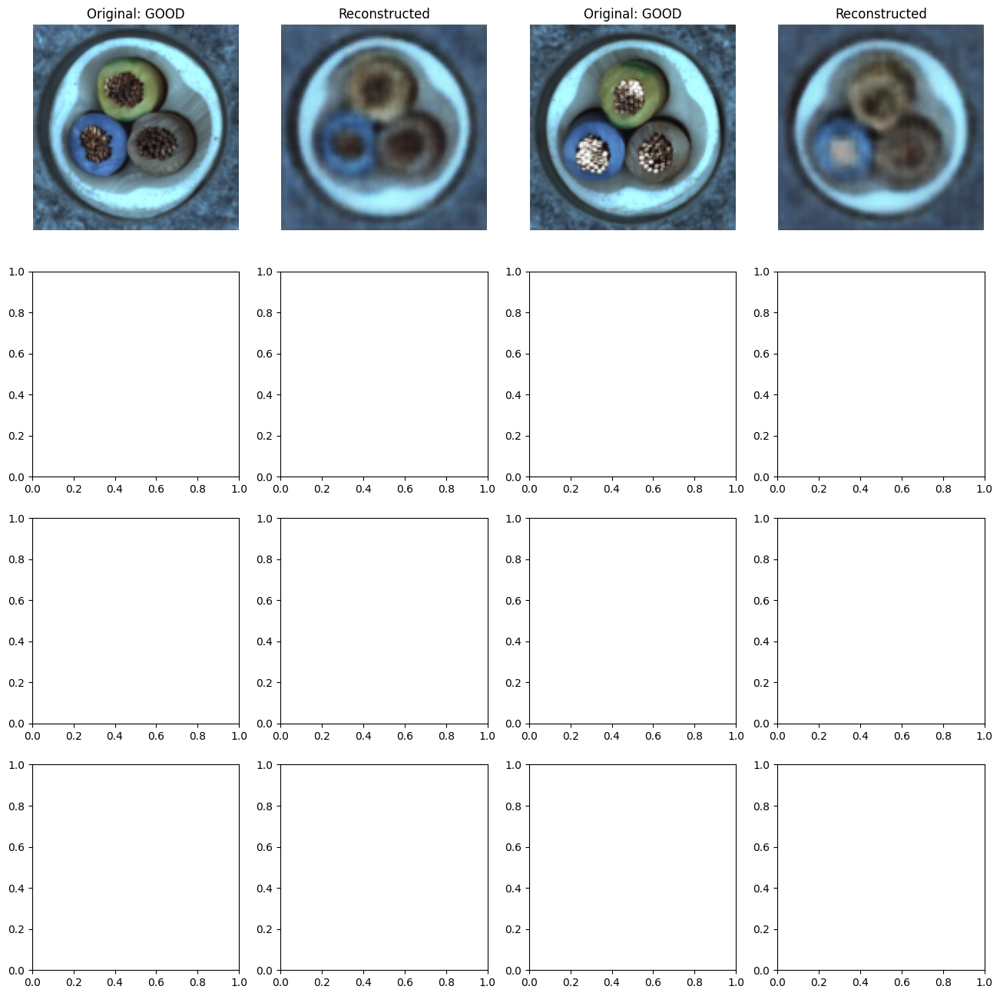

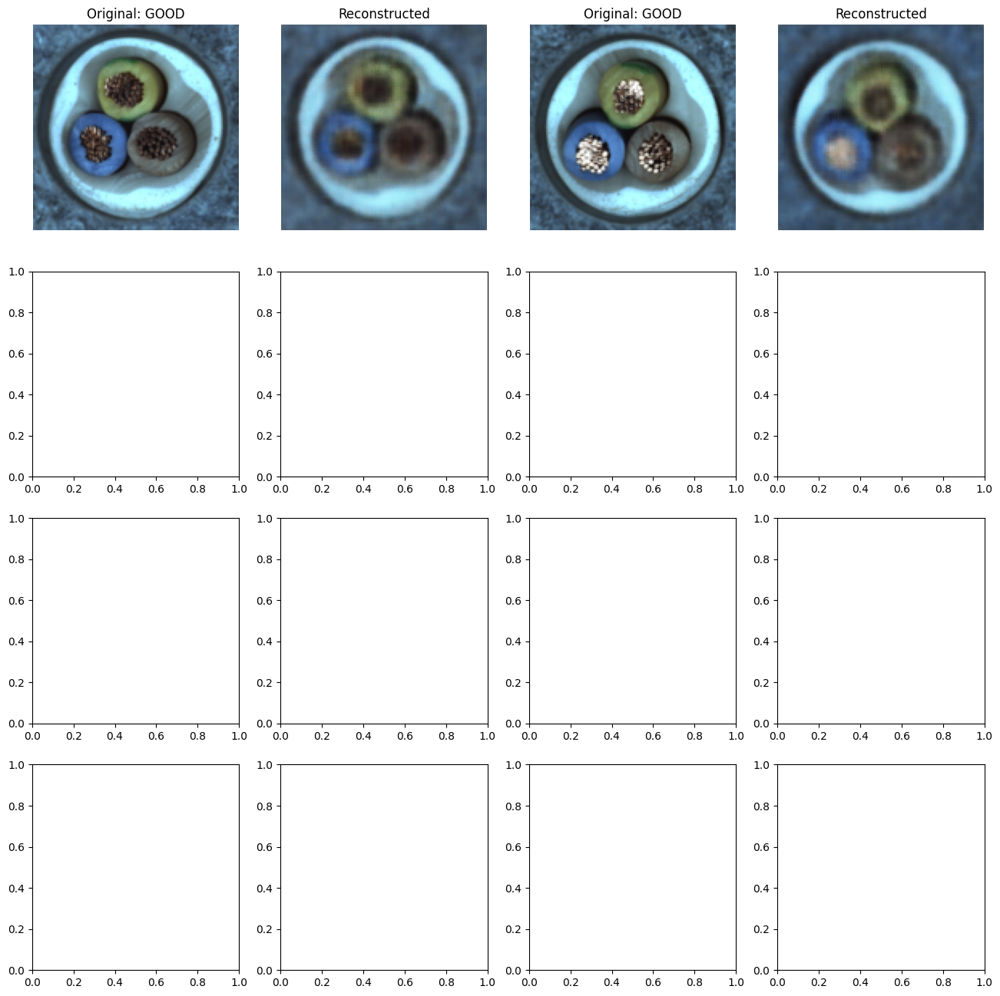

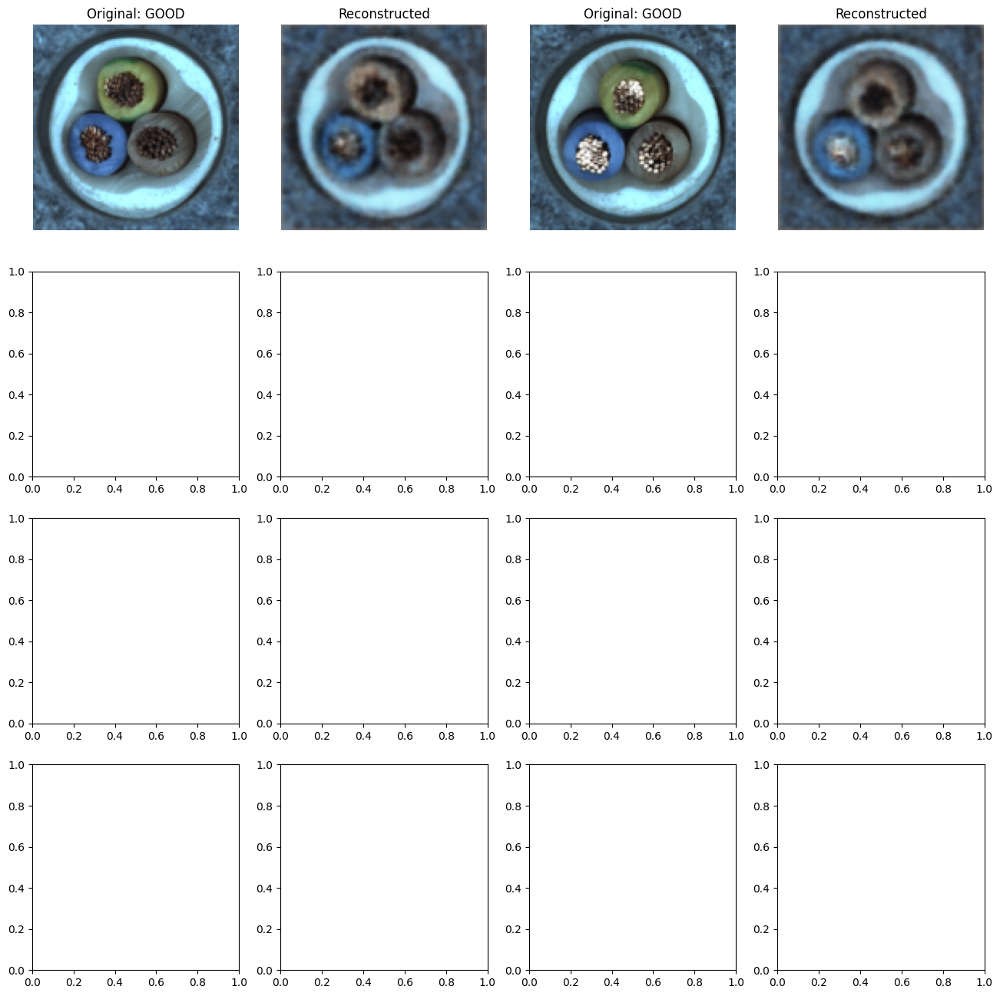

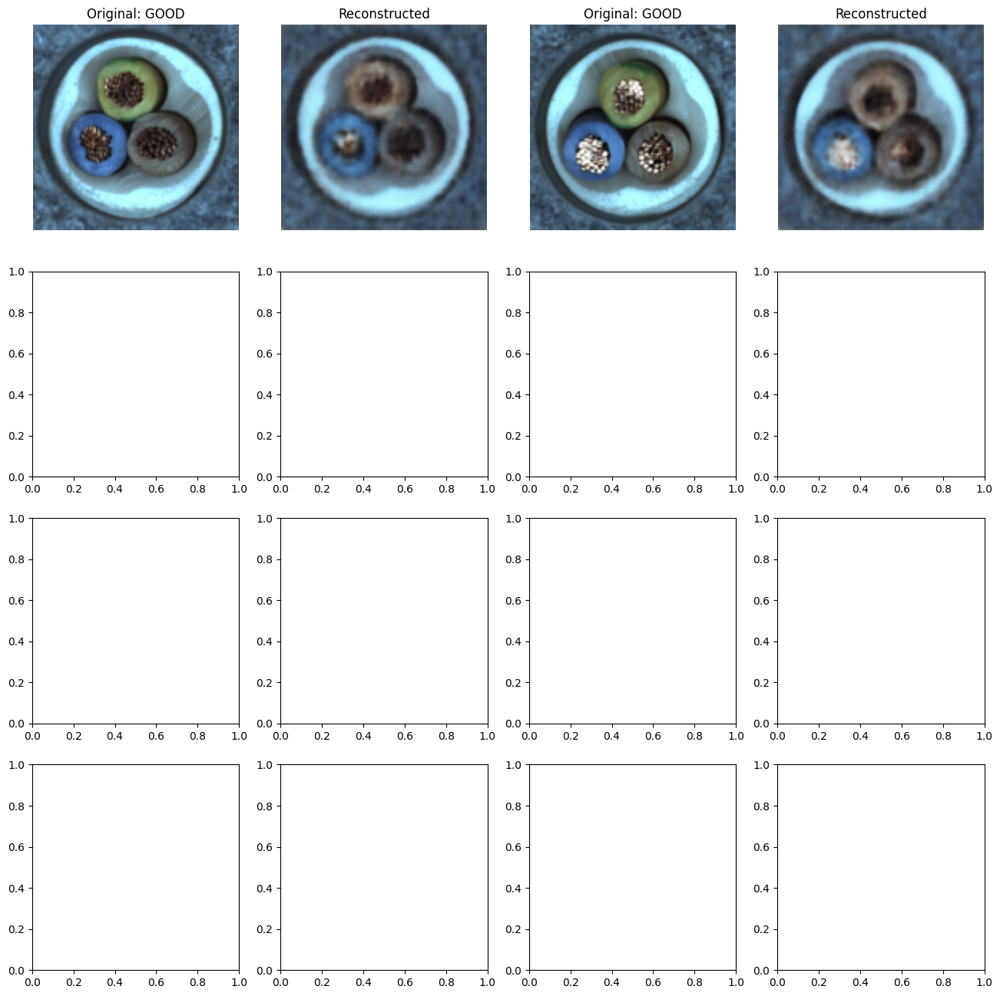

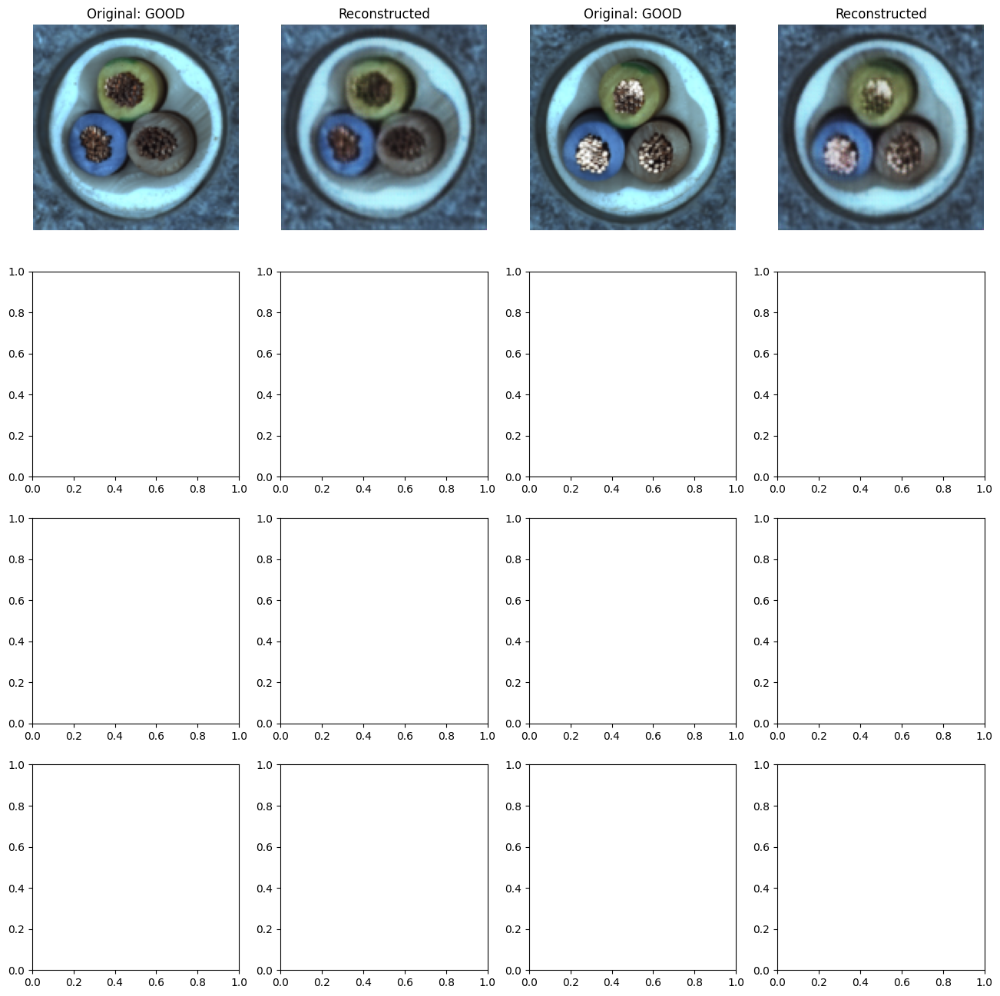

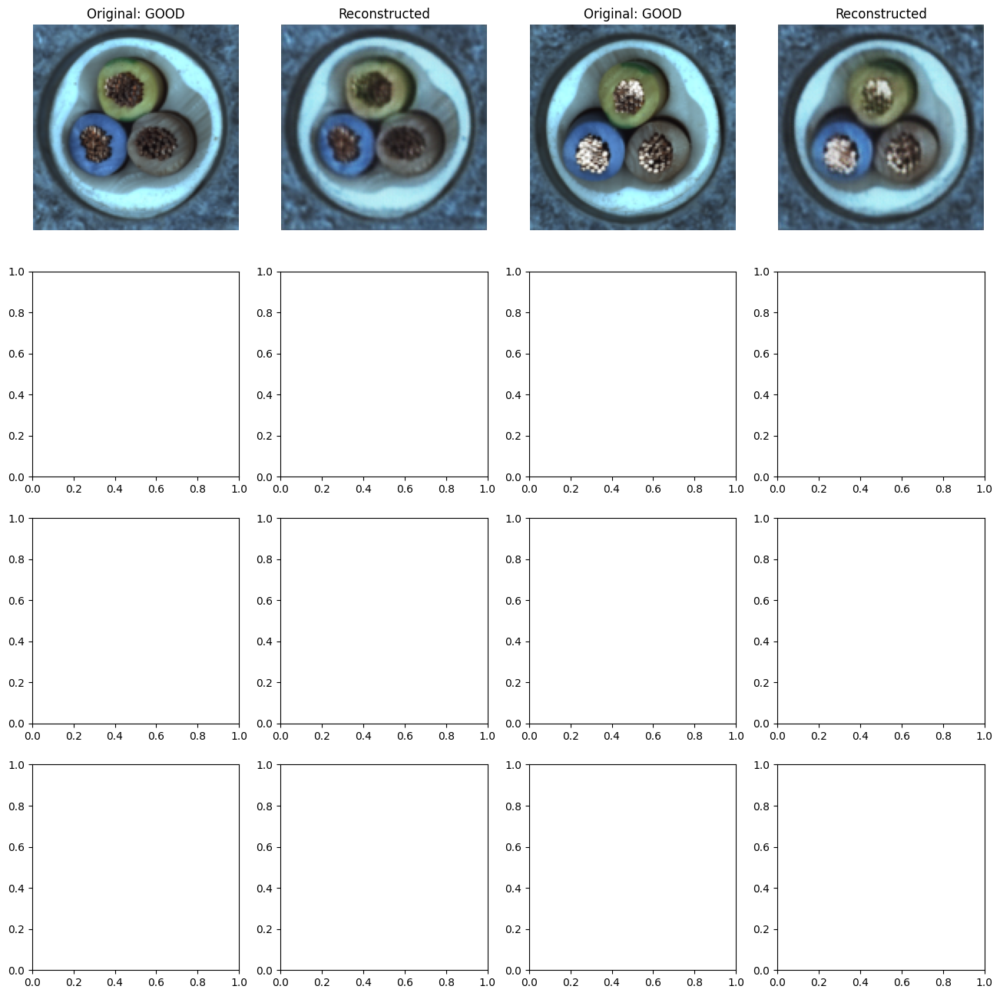

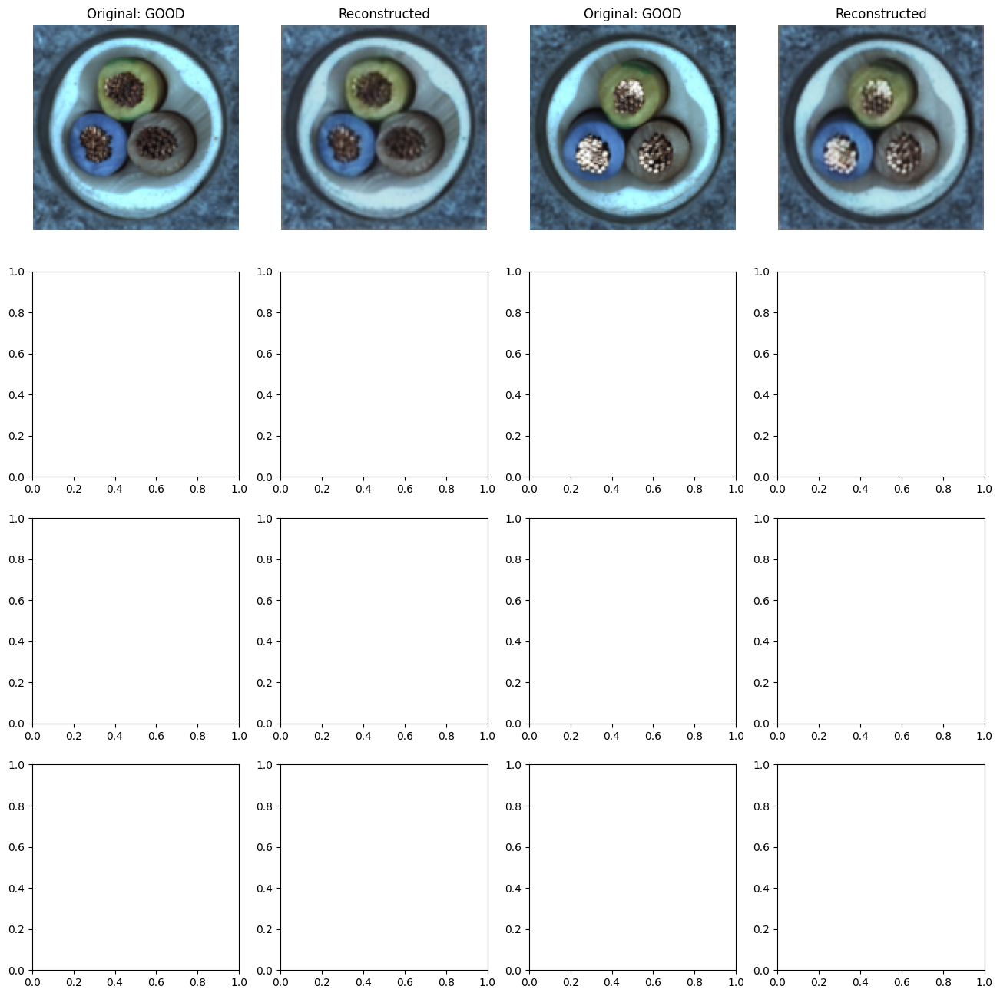

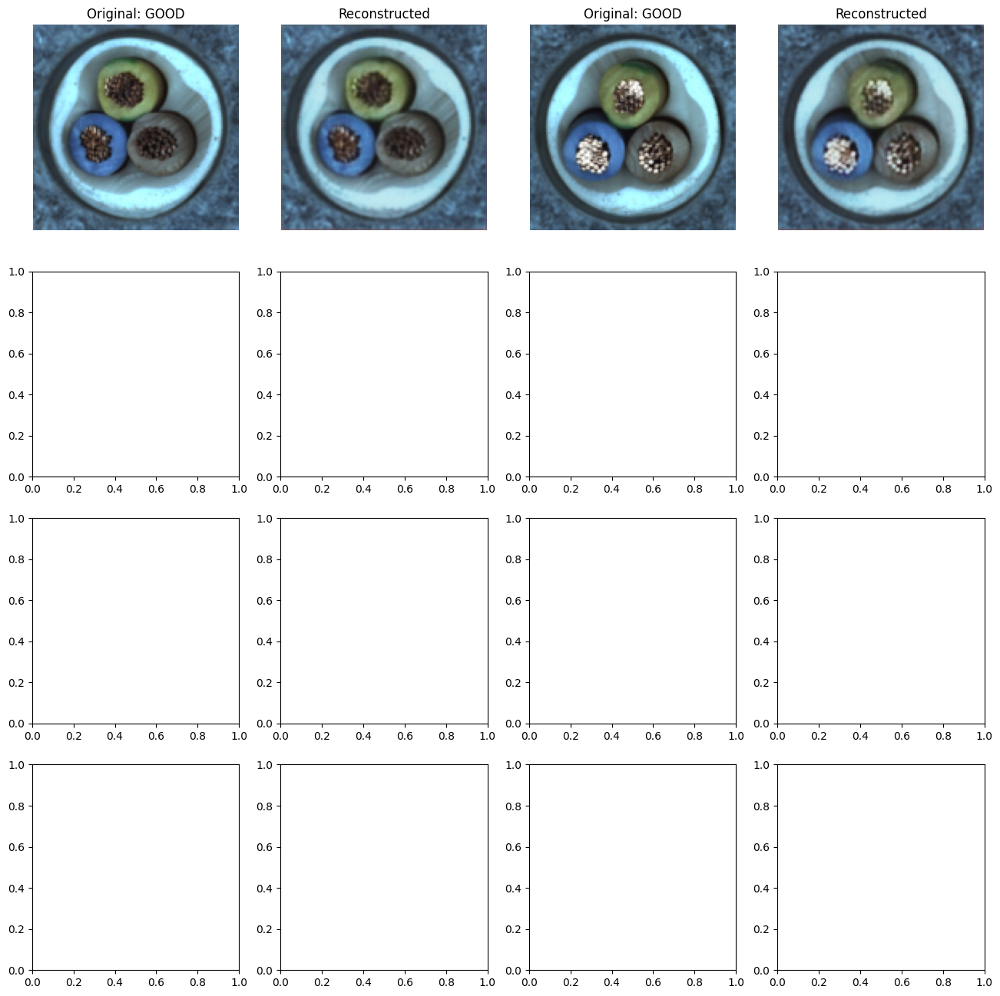

In [52]:
# EJECUTAR TODOS LOS EXPERIMENTOS
def run_all_experiments():
    """Ejecuta los 8 experimentos requeridos por la tarea"""
    models = ["classic", "unet"]
    losses = ["l1", "l2", "ssim", "ssim_l1"]

    total_experiments = len(models) * len(losses)
    current = 1

    for model in models:
        for loss in losses:
            print(f"EXPERIMENTO {current}/{total_experiments}: {model} + {loss}")


            run_single_experiment(model, loss)
            current += 1

print("Iniciando las 8 configuraciones")
run_all_experiments()
print("Todos los experimentos se completaron")

In [53]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
from collections import defaultdict

classic_l1: val_loss final = 0.034624531865119934
classic_l2: val_loss final = 0.0033042430877685547
classic_ssim: val_loss final = 0.1820291429758072
classic_ssim_l1: val_loss final = 0.1451883316040039
unet_l1: val_loss final = 0.014087970368564127
unet_l2: val_loss final = 0.00042026949813589454
unet_ssim: val_loss final = 0.016097376123070717
unet_ssim_l1: val_loss final = 0.016897138208150864


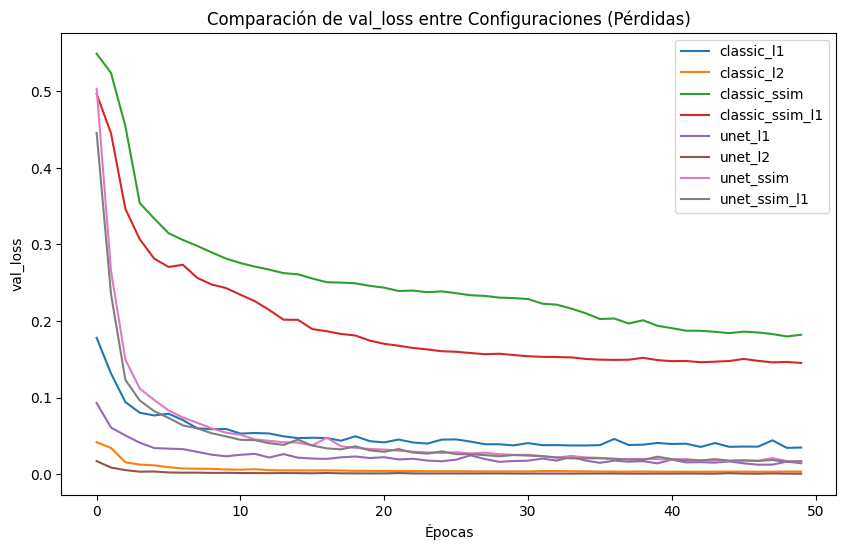

In [57]:
# Fetch métricas y compara
losses = ['l1', 'l2', 'ssim', 'ssim_l1']
architectures = ['classic', 'unet']
comparison_data = {}

for arch in architectures:
    for loss in losses:
        try:
            run_id = f"{arch}_{loss}"
            run = next(r for r in runs if r.name == run_id)
            history = run.history(keys=['val_loss'])
            comparison_data[run_id] = history['val_loss'].values
            print(f"{run_id}: val_loss final = {run.summary.get('val_loss', 'N/A')}")


        except StopIteration:
            print(f"Run {run_id} no encontrado.")

# Gráfica comparativa de val_loss (para comparación entre configs)
fig, ax = plt.subplots(figsize=(10, 6))
for run_id, val_losses in comparison_data.items():
    ax.plot(range(len(val_losses)), val_losses, label=run_id)
ax.set_title('Comparación de val_loss entre Configuraciones (Pérdidas)')
ax.set_xlabel('Épocas')
ax.set_ylabel('val_loss')
ax.legend()
plt.show()

